### DEEP LEARNING EXAM PAPER - I

Submitted by: Pushkar Khedkar

**PIZZA CLASSIFICATION PROBLEM , GOOD OR BURNT.** 

A famous 30 year old pizza brand which has outlets in more than 90 countries started home
delivery services a couple of years ago and the business has grown much faster than expected.
However, outlet vendors are very much disappointed with few customers for their cheating
activities. This is because vendors, shockingly, came to know that few customers after receiving the
delivery are raising tickets for refund in the name of burnt pizzas. Even though customers received
a good pizza but still few customers are trying to cheat vendors. To overcome this issue, Franchise
has come up with an idea to integrate a pizza detection model in their application where customers
can upload images for the burnt pizzas delivered. For example, if I have received a burnt pizza then
I can upload a couple of images of the pizza to the application and it will classify the pizza as burnt
or good in order to process my refund ticket.

**Goal:** You are hired as Deep Learning Engineer by a famous pizza franchise. You are asked to build
a model where it accepts the images of pizza and detects as burnt pizza or good pizza.

**Constraints:** You should be using only ANN and shouldn’t be using CNN or any other rule based
model to generate results.

**Data Description:** Data is in the form of images collected from multiple sources of the internet.
    
**Provided Files:**
**Train set:** Train set is divided into burnt pizza and good pizza categories. While training the
model you can label images of good pizza as 1 and burnt pizza as 0.

**Test:** Test set contains mixed images of both burnt pizzas and good pizzas.
    
**Instructions:**
1. Train set should be used to feed the model.
2. Test set should be used to predict labels for test data.

**Evaluation Criteria:** The evaluation metric for this problem statement is the Accuracy score
where each image label is matched with the actual image label.


In [1]:
#importing essential liabraries
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix , accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD
import pickle
import time
import cv2
import numpy as np
import itertools
import warnings
import random
import os
from imutils import paths
from tensorflow.keras.models import load_model

In [2]:
#loading the data
classes_list=["Good_pizza","Burnt_pizza"]
data = []
labels = []
pathimgs = sorted(list(paths.list_images("train")))
random.seed(10)
random.shuffle(pathimgs)
for pathimg in pathimgs:
    image =cv2.imread(pathimg)
    image = cv2.resize(image,(32,32)).flatten()
    data.append(image)
    label=pathimg.split(os.path.sep)[-2]
    label = 1 if label == "Burnt_pizza" else 0
    labels.append(label)
data=np.array(data,dtype="float")/255.0
labels=np.array(labels)
print("Number of images: ",len(data))

Number of images:  709


### Train-test split:

In [3]:
x_train, x_test, y_train, y_test = train_test_split(data,labels,test_size=0.2,random_state=10)

### Converting labels to vectors:

In [4]:
y_train = to_categorical(y_train,num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

### ANN

In [5]:
model = Sequential()
#3072 as there are 32*32*3 = 3072 pixels
model.add(Dense(units=2048,input_shape = (3072,),kernel_initializer="uniform",activation='relu')) #first hidden Layer has 2048 nodes
model.add(Dropout(0.4)) #droput for second layer
model.add(Dense(units=1024,kernel_initializer='uniform',activation='relu')) #second hidden layer with 1024 nodes
model.add(Dense(units=2,kernel_initializer='uniform',activation='softmax')) #output layer with no. of class labels

### Compliation:

In [6]:
initial_LR = 0.01
Epochs = 50
#compiling the model using SGD optimizer and categorical cross_entropy loss.
opt= SGD(learning_rate=initial_LR)
model.compile(loss="binary_crossentropy",optimizer=opt,metrics=["accuracy"])

In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 2048)              6293504   
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 2050      
Total params: 8,393,730
Trainable params: 8,393,730
Non-trainable params: 0
_________________________________________________________________


In [8]:
### Training
Model = model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=Epochs, batch_size=32)

Epoch 1/50
18/18 [==============================] - 1s 29ms/step - loss: 0.6484 - accuracy: 0.6155 - val_loss: 0.5744 - val_accuracy: 0.6901
Epoch 2/50
18/18 [==============================] - 0s 23ms/step - loss: 0.5827 - accuracy: 0.6966 - val_loss: 0.5316 - val_accuracy: 0.7254
Epoch 3/50
18/18 [==============================] - 0s 23ms/step - loss: 0.5346 - accuracy: 0.7496 - val_loss: 0.5078 - val_accuracy: 0.8169
Epoch 4/50
18/18 [==============================] - 0s 23ms/step - loss: 0.5043 - accuracy: 0.7760 - val_loss: 0.4956 - val_accuracy: 0.7394
Epoch 5/50
18/18 [==============================] - 0s 24ms/step - loss: 0.4859 - accuracy: 0.7672 - val_loss: 0.4688 - val_accuracy: 0.7817
Epoch 6/50
18/18 [==============================] - 0s 23ms/step - loss: 0.4644 - accuracy: 0.7937 - val_loss: 0.4638 - val_accuracy: 0.7817
Epoch 7/50
18/18 [==============================] - 0s 23ms/step - loss: 0.4459 - accuracy: 0.7972 - val_loss: 0.4441 - val_accuracy: 0.8169
Epoch 8/50
18

# Evaluation

### Accuracy plot w.r.t epochs:

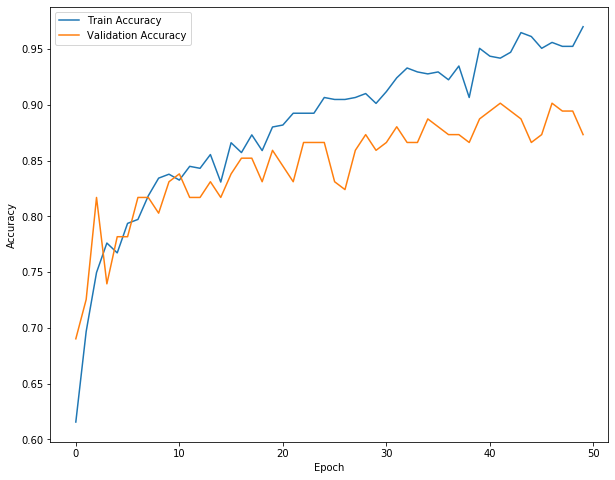

In [9]:
x=np.arange(0,Epochs)
plt.figure(figsize = [10,8])
plt.plot(x,Model.history["accuracy"],label="Train Accuracy")
plt.plot(x,Model.history["val_accuracy"],label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

### Classification report:

In [12]:
pred_probs = model.predict(x_test,batch_size=32)
y_test_ = [np.argmax(i) for i in y_test]
y_pred = [np.argmax(i) for i in pred_probs]
print("*"*20,'Classification report',"*"*20)
print("")
print(classification_report(y_test_,y_pred))    

******************** Classification report ********************

              precision    recall  f1-score   support

           0       0.83      0.99      0.91        87
           1       0.97      0.69      0.81        55

    accuracy                           0.87       142
   macro avg       0.90      0.84      0.86       142
weighted avg       0.89      0.87      0.87       142



### Accuracy score:

In [13]:
acc= accuracy_score(y_test_,y_pred)
print("Accuracy of the model: ", acc)

Accuracy of the model:  0.8732394366197183


### Saving the model:

In [14]:
model.save("DL_ANN.h5")

# PREDICTIONS USING MODEL

C:\Users\Pushkar\anaconda3\lib\site-packages\ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\Pushkar\anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


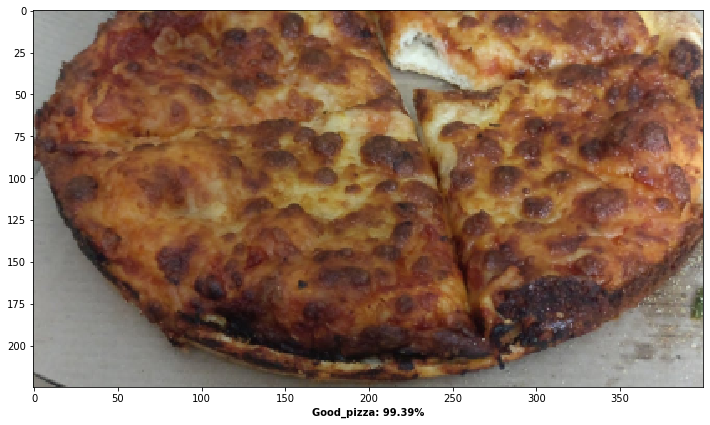

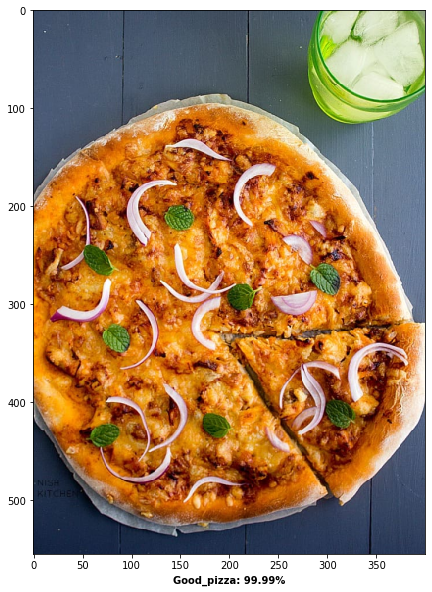

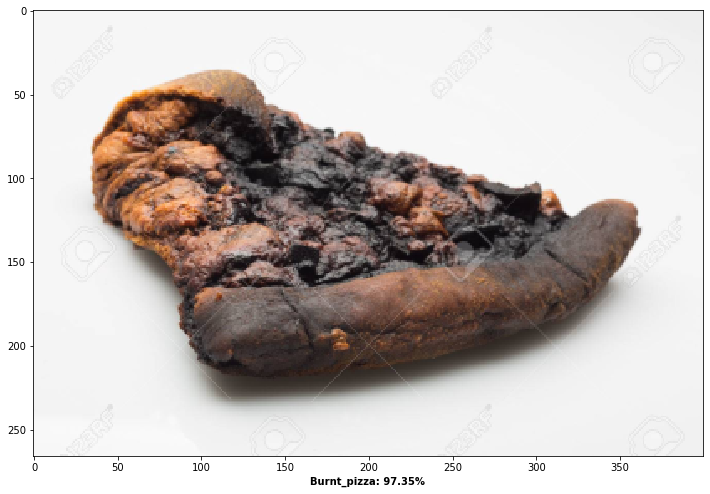

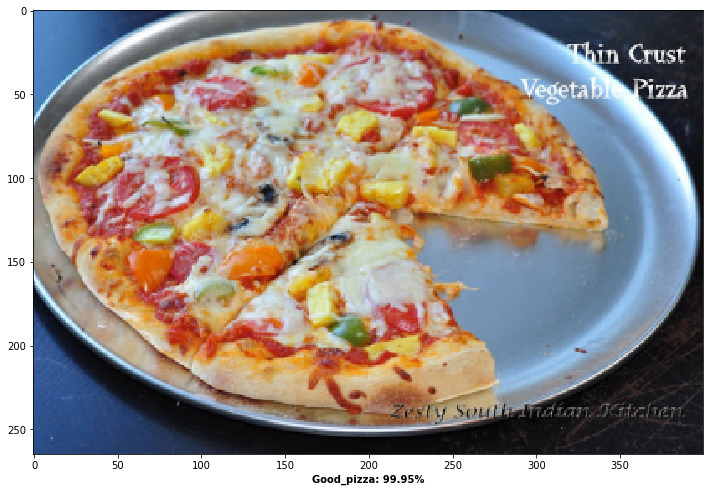

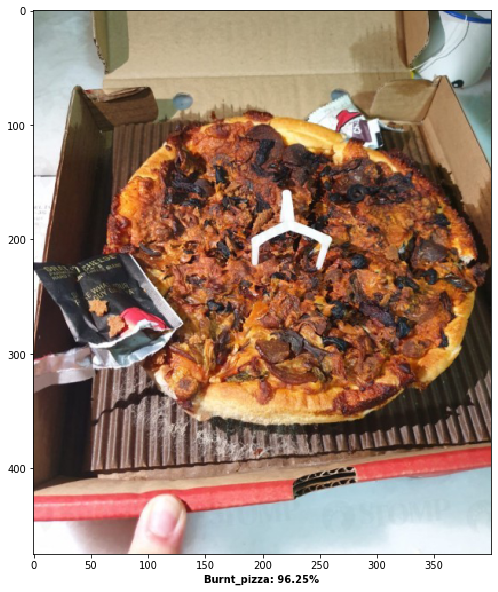

...

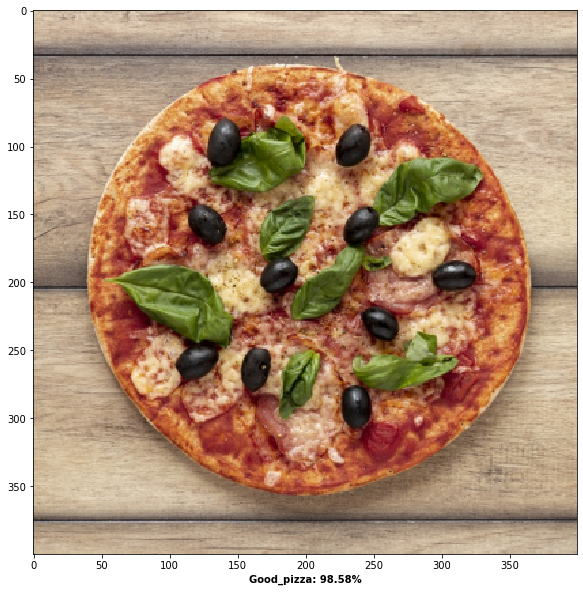

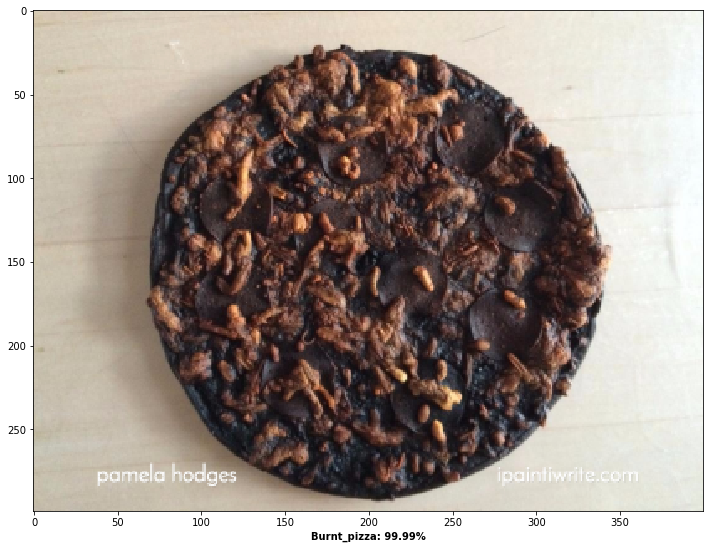

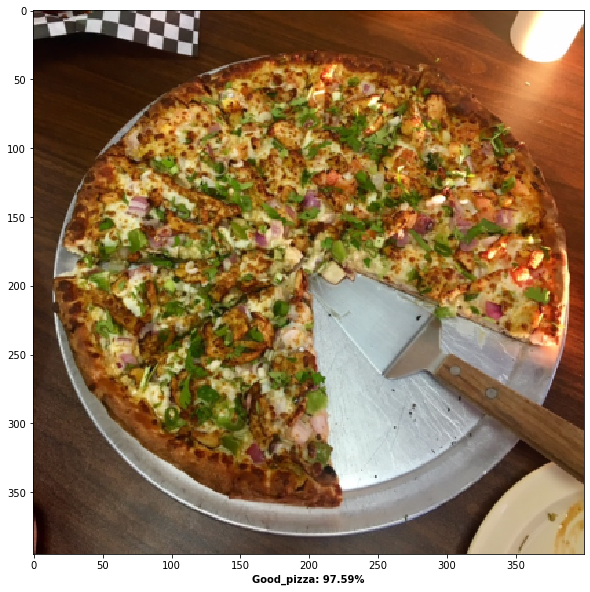

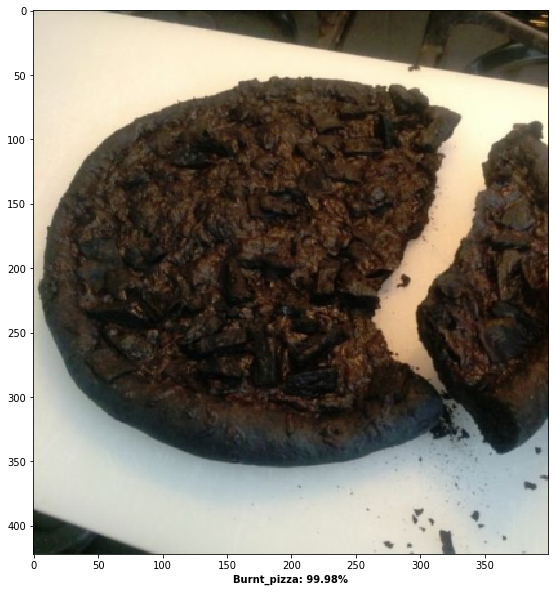

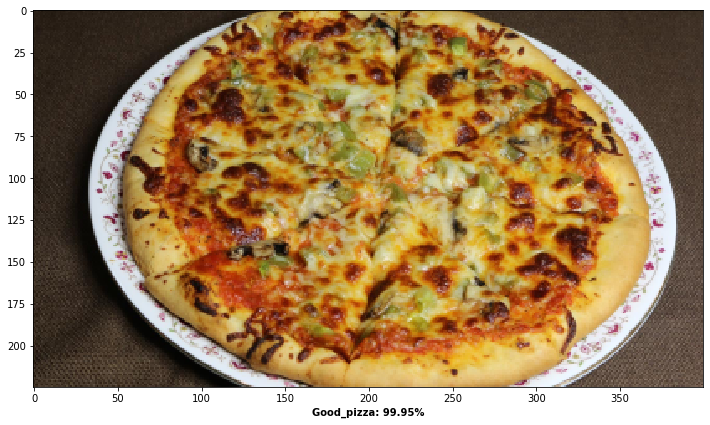

In [15]:
#load the model
model = load_model("model_ANN.h5")
pathimgsT = sorted(list(paths.list_images('test')))
for pathimg in pathimgsT:
    image = cv2.imread(pathimg)
    output = image.copy()
    image = cv2.resize(image, (32,32))
    image = image.astype("float") / 255.0
    image = image.flatten()
    image = image.reshape((1, image.shape[0]))
    preds = model.predict(image)  #making predictions
    i = preds.argmax(axis=1)[0]
    label = classes_list[i]
    label = "{}: {:.2f}%".format(label, preds[0][i] * 100)
    output = imutils.resize(output, width=400)
    img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
    fig = plt.figure(figsize=(12,10))
    plt.xlabel(label, weight="bold")
    ax = fig.add_subplot(111)
    ax.imshow(img)